<table>
    <tr>
        <td>
            <img src="extra/logo-mgu.png" width="150" height="150" />
        </td>
        <td>
        <img src="extra/logo-dep.png" width="150" height="150" />
        </td>
        <td>
            <center>
                <font size = 1>
                2019-2020, MОСКВА, МОСКОВСКИЙ ГОСУДАРСТВЕННЫЙ УНИВЕРСИТЕТ<br>
                ГЕОГРАФИЧЕСКИЙ ФАКУЛЬТЕТ, КАФЕДРА ФИЗИЧЕСКОЙ ГЕОГРАФИИ И ЛАНДШАФТОВЕДЕНИЯ<br><br>
                </font>
                <font size = 3>
                Материалы к работе<br> <b>Рассчет спектральных индексов в Баргузинском заповеднике</b><br><br>
                </font>
                <font size = 2>
                <b>Олег Железный</b><br>
                Руководитель Д.Н.Козлов
                </font>
            </center>
        </td>
    </tr>
</table>


Шапка данного проекта позаимствована у https://github.com/silenteddie/SCGIS_RS_Workshop, за что им большое спасибо.

In [3]:
# импортируем программные библиотеки, которые помогут нам работать со спутниковыми данными

# Основное средство - GDAL. Основной компонент работы с растровыми геоданными, который вообще везде
from osgeo import gdal

# matplotlib - самая большая и мощная библиотека визуализации данных в Python
import matplotlib.pyplot as plt
import matplotlib as mpl

# numpy - одна из главных математических библиотек Python. Быстрые вычисления матриц (а снимки - это матрицы)
import numpy as np

# Некоторые служебные команды. Так мы сможем смотреть на изображения прямо в jupyter notebook
from IPython.display import Image

(-0.5, 3225.5, 1850.5, -0.5)

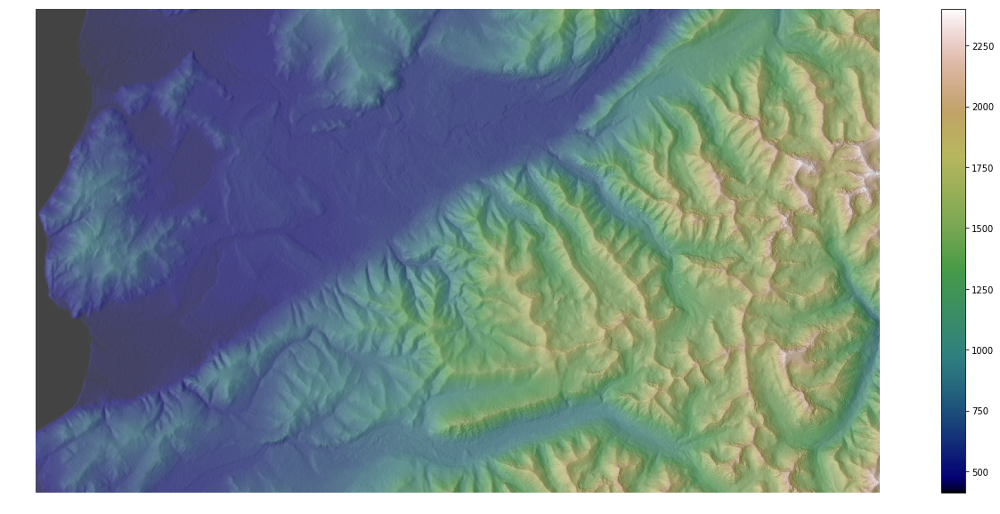

In [4]:
elev=gdal.Open('D:/Barguzinsky/DEM/Cropped ALOS/DEM.tif').ReadAsArray()
hill=gdal.Open('D:/Barguzinsky/DEM/Cropped ALOS/Hillshading.tif').ReadAsArray()
mpl.rcParams['figure.figsize'] = (25,10)
plt.imshow(elev, cmap='gist_earth')
plt.colorbar()
plt.imshow(hill, alpha=0.4, cmap='binary')
plt.axis('off')

In [5]:
#loading data
#empty list of variables
reflectances_august=[]
for i in [2,3,4,8,11,12]:
    name='B%s_august' %i
    reflectances_august.append(name)
    locals()[name] = gdal.Open('D:/Barguzinsky/Imagery/Sentinel_cut/20180811/T49UDA_20180811T035529_B%s.asc' % i).ReadAsArray()
    
reflectances_march=[]
for i in [2,3,4,8,11,12]:
    name='B%s_march' %i
    reflectances_march.append(name)
    locals()[name] = gdal.Open('D:/Barguzinsky/Imagery/Sentinel_cut/20190306/T49UDA_20190306T034619_B%s.asc' % i).ReadAsArray()

In [6]:
reflectances_march

['B2_march', 'B3_march', 'B4_march', 'B8_march', 'B11_march', 'B12_march']

In [7]:
B4_august = gdal.Open('D:/Barguzinsky/Imagery/Sentinel_cut/20180811/T49UDA_20180811T035529_B4.asc').ReadAsArray()

Размеры наших снимков.

In [8]:
dataset = gdal.Open('D:/Barguzinsky/Imagery/Sentinel_cut/20190306/T49UDA_20190306T034619_B2.asc')
X=dataset.RasterXSize
Y=dataset.RasterYSize

Основная часть. Рассчитаем EVI = 2.5 х (7.5 х Blue + NIR - Red)/(6 х Red + NIR); NDWI = (NIR - SWIR)/(NIR + SWIR).
У Sentinel соответствующая раскладка каналов:
<td>
    <img src="extra/Landsat.v.Sentinel.png" width="500" height="300" />
</td>

In [9]:
NDVI_march = (B8_march-B4_march)/(B4_march+B8_march)

(-0.5, 4032.5, 2313.5, -0.5)

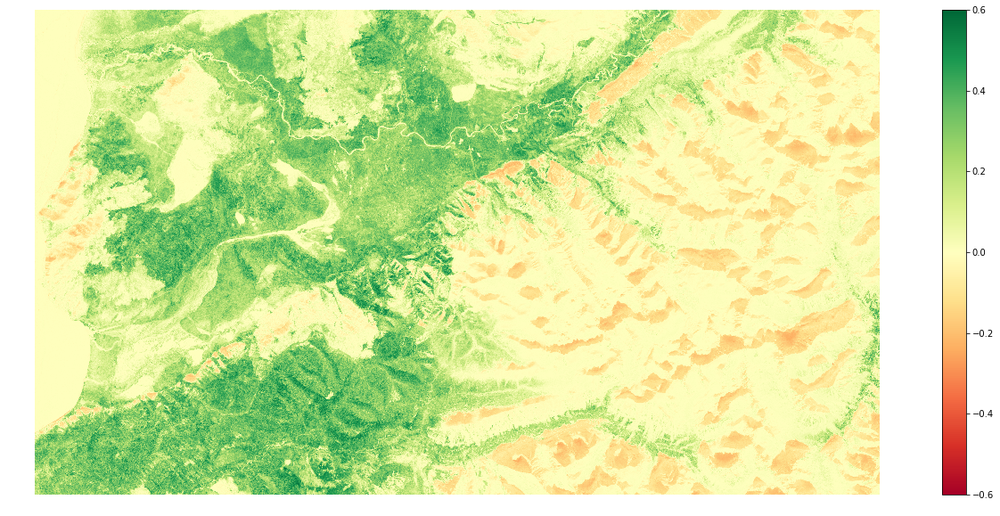

In [10]:
mpl.rcParams['figure.figsize'] = (25,10)

#plt.subplot(131)
plt.imshow(NDVI_march, vmin=-0.6, vmax=0.6, cmap='RdYlGn')
plt.colorbar()
plt.axis('off')

In [11]:
# описываем функцию, которая будет нормализовать значения канала в диапазон от 0 до 1
def normalize(input_band):
    max_value=input_band.max()
    input_band[input_band==-99999] = 123456789.987654321
    min_value=input_band.min()
    input_band[input_band==123456789.987654321] = np.nan
    return ((input_band - min_value)/(max_value - min_value))

# вызываем эту функцию для всех наших трёх каналов
B2_n = normalize(B2_march)
B3_n = normalize(B3_march)
B4_n = normalize(B4_march)

In [12]:
B2_m=(B2_n)**(1/1.9)
B3_m=(B3_n)**(1/1.9)
B4_m=(B4_n)**(1/1.9)

Text(0.5,1,'RGB composite image')

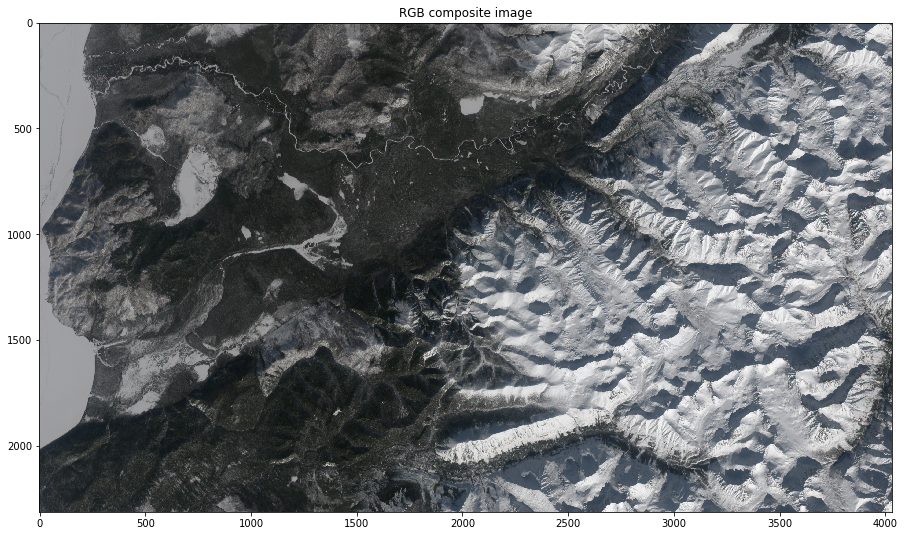

In [13]:
Composite_m = np.dstack([B4_m, B3_m, B2_m])

mpl.rcParams['figure.figsize'] = (17,9)
plt.imshow(Composite_m)
plt.title('RGB composite image')

In [14]:
EVI2_march = 2.5*((B8_march/10000-B4_march/10000)/(2.4*B4_march/10000+B8_march/10000+1))

(-0.5, 4032.5, 2313.5, -0.5)

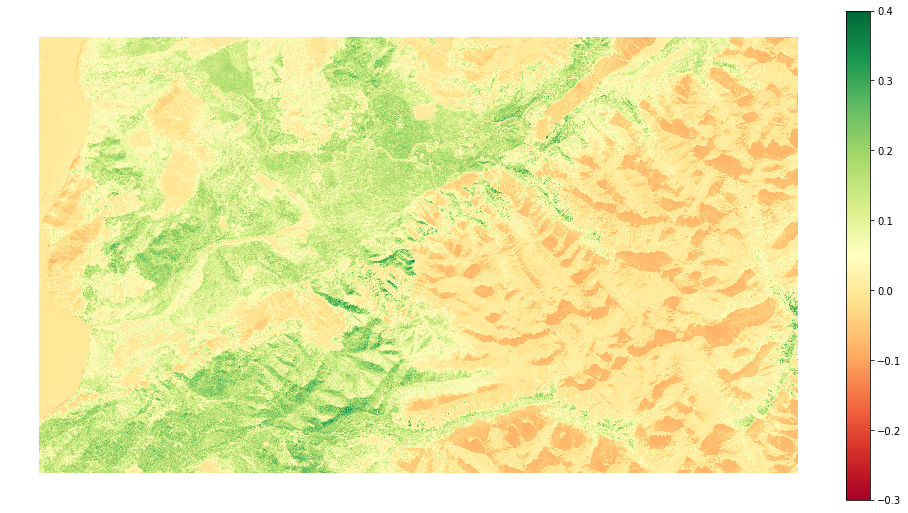

In [15]:
plt.imshow(EVI2_march, vmax=0.4, vmin=-0.3, cmap='RdYlGn')
plt.colorbar()
plt.axis('off')

In [16]:
NDWI_march = (B8_march-B11_march)/(B11_march+B8_march)

(-0.5, 4032.5, 2313.5, -0.5)

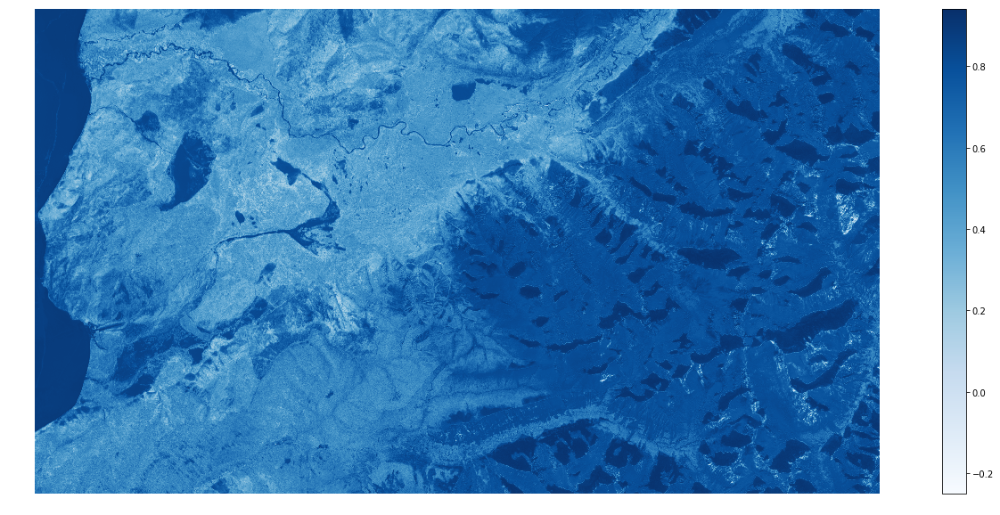

In [17]:
mpl.rcParams['figure.figsize'] = (25,10)

#plt.subplot(131)
plt.imshow(NDWI_march, vmin=-0.25, cmap='Blues')
plt.colorbar()
plt.axis('off')

In [18]:
NDVI_august = (B8_august-B4_august)/(B4_august+B8_august)

(0.0, 3226.0, 0.0, 1851.0)

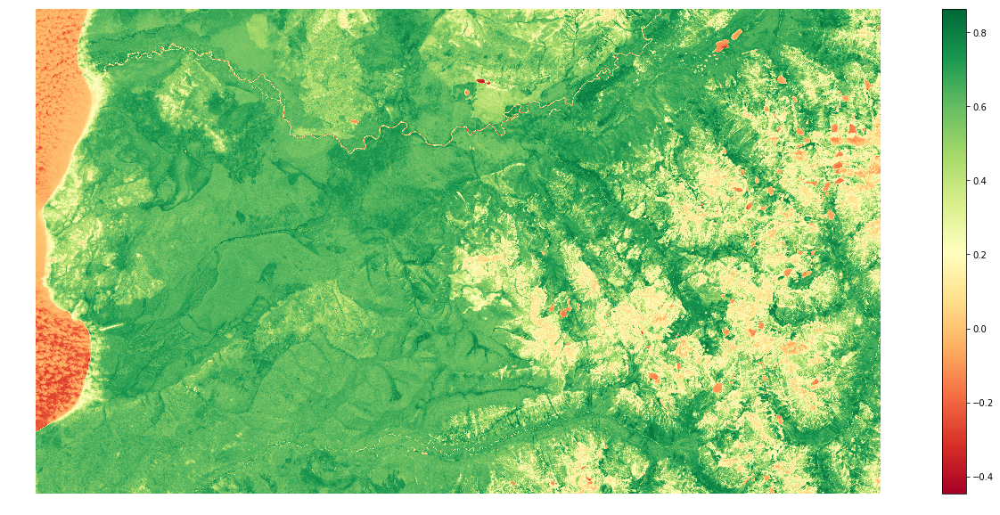

In [19]:
plt.imshow(NDVI_august, extent=[0,3226,0,1851], cmap='RdYlGn')
plt.colorbar()
#plt.imshow(hill, alpha=hill, extent=[0,3226,0,1851], cmap='binary')
plt.axis('off')

In [20]:
EVI2_august = 2.5*((B8_august-B4_august)/(B8_august+2.4*B4_august+10000))

In [21]:
np.max(EVI2_august)

0.8456618

(-0.5, 4032.5, 2313.5, -0.5)

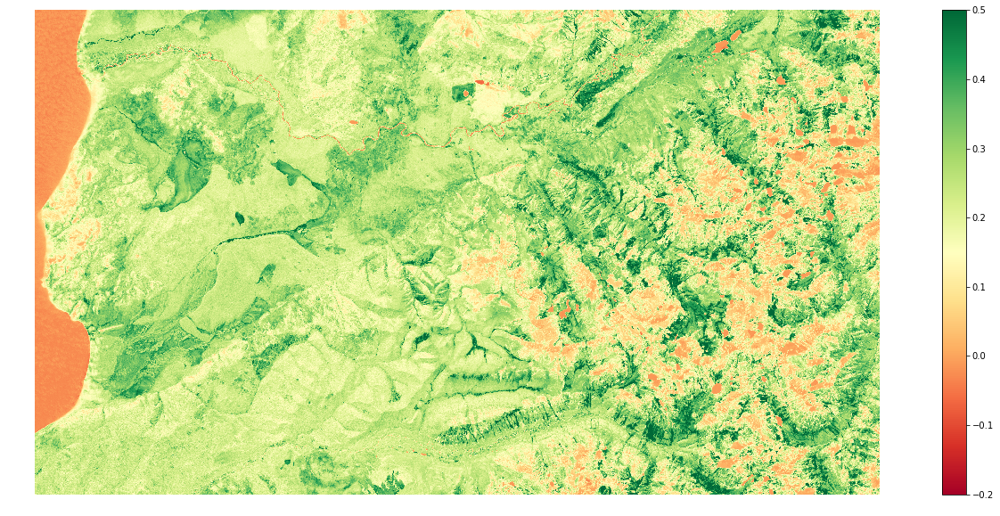

In [22]:
plt.imshow(EVI2_august, vmax=0.5, vmin=-0.2, cmap='RdYlGn')
plt.colorbar()
plt.axis('off')

In [23]:
NDWI_august = (B8_august-B11_august)/(B8_august+B11_august)

(-0.5, 4032.5, 2313.5, -0.5)

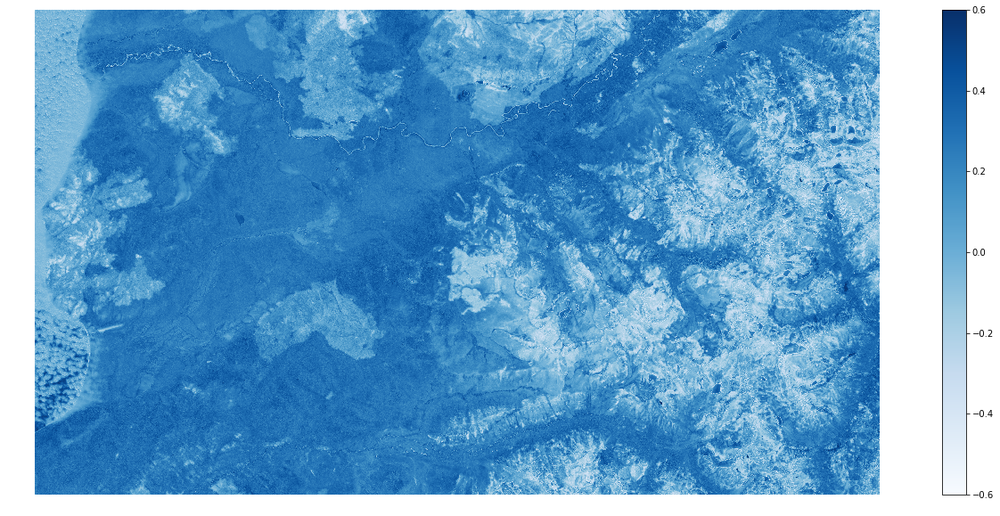

In [24]:
plt.imshow(NDWI_august, vmin=-0.6, vmax=0.6, cmap='Blues')
plt.colorbar()
plt.axis('off')

Теперь Tasseled Cap, "Шапочка с кисточкой"
https://www.indexdatabase.de/db/i-single.php?id=93

In [25]:
Wetness_march=(0.1509*B2_march+0.1973*B3_march+0.3279*B4_march+0.3406*B8_march-0.7112*B11_march-0.4572*B12_march)/10000
Wetness_august=(0.1509*B2_august+0.1973*B3_august+0.3279*B4_august+0.3406*B8_august-0.7112*B11_august-0.4572*B12_august)/10000
Brightness_march=(0.3037*B2_march+0.2793*B3_march+0.4743*B4_march+0.5585*B8_march+0.5082*B11_march+0.1863*B12_march)/10000
Brightness_august=(0.3037*B2_august+0.2793*B3_august+0.4743*B4_august+0.5585*B8_august+0.5082*B11_august+0.1863*B12_august)/10000
Greenness_march=(-0.2848*B2_march-0.2435*B3_march-0.5436*B4_march+0.7243*B8_march+0.0840*B11_march-0.1800*B12_march)/10000
Greenness_august=(-0.2848*B2_august-0.2435*B3_august-0.5436*B4_august+0.7243*B8_august+0.0840*B11_august-0.1800*B12_august)/10000

(-0.5, 4032.5, 2313.5, -0.5)

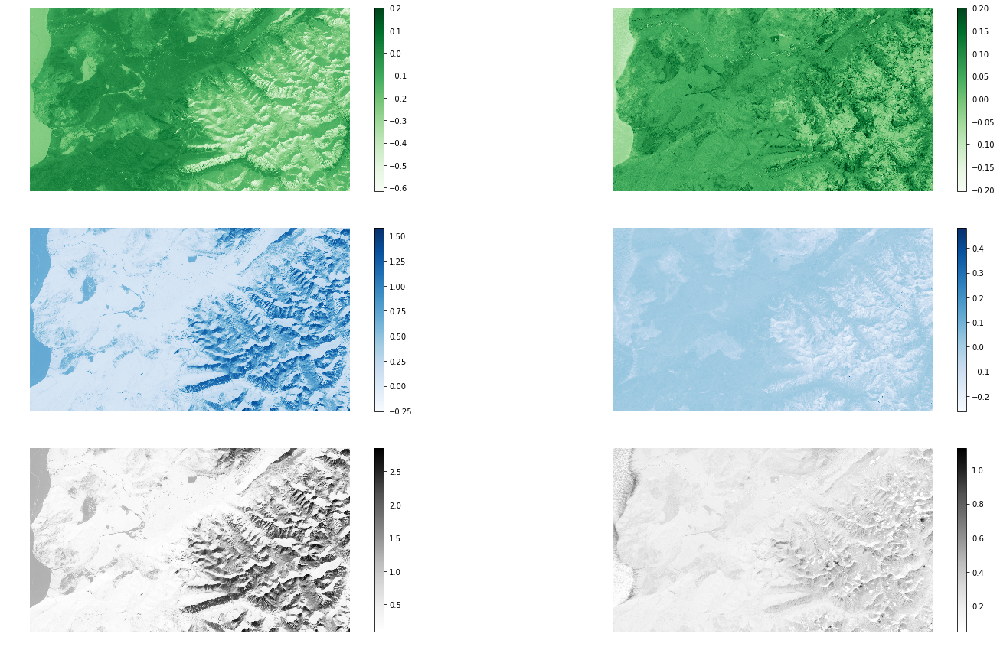

In [26]:
mpl.rcParams['figure.figsize'] = (25,15)
plt.subplot(321)
plt.imshow(Greenness_march, vmax=0.2, cmap='Greens')
plt.colorbar()
plt.axis('off')
plt.subplot(323)
plt.imshow(Wetness_march, cmap='Blues')
plt.colorbar()
plt.axis('off')
plt.subplot(325)
plt.imshow(Brightness_march, cmap='Greys')
plt.colorbar()
plt.axis('off')

plt.subplot(322)
plt.imshow(Greenness_august, vmax=0.2, cmap='Greens')
plt.colorbar()
plt.axis('off')
plt.subplot(324)
plt.imshow(Wetness_august, cmap='Blues')
plt.colorbar()
plt.axis('off')
plt.subplot(326)
plt.imshow(Brightness_august, cmap='Greys')
plt.colorbar()
plt.axis('off')

R-squared= 0.1148795131321054


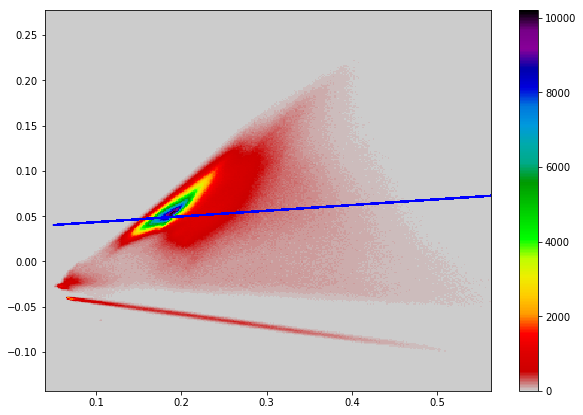

In [77]:
y=Greenness_august.ravel()
x=Brightness_august.ravel()

l1=np.max(x)*0.5
l2=np.min(x)*0.8
l3=np.max(y)*0.7
l4=np.min(y)*0.7

mpl.rcParams['figure.figsize'] = (10,7)
plt.hist2d(x, y, (300,300), [[l2,l1], [l4,l3]], cmap='nipy_spectral_r')
plt.xedges=('off')
plt.colorbar()

#ravel() переводит двумерный ряд в одномерный
#теперь статистика

from scipy import stats
slope, intercept, r_value, pvalue, stderr=stats.linregress(x, y)
print('R-squared=', r_value)

plt.plot(x, intercept+slope*x, 'b', label='trend line')

(0.0, 3226.0, 0.0, 1851.0)

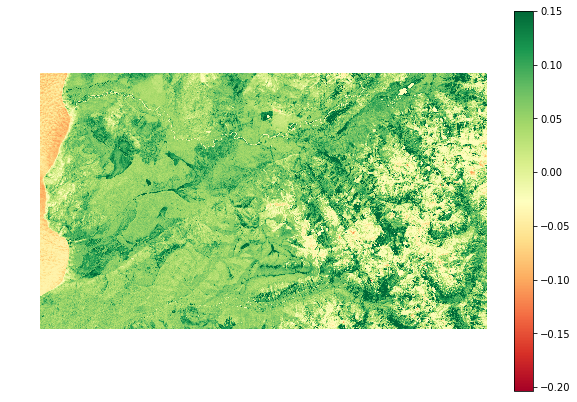

In [28]:
plt.imshow(Greenness_august, vmax=0.15, extent=[0,3226,0,1851], cmap='RdYlGn')
plt.colorbar()
plt.axis('off')

Теперь снижение размерности. 
Задача - выразить инвариантную и динамическую части.

In [29]:
reflectances=reflectances_march+reflectances_august

In [30]:
#a=locals()[reflectances[0]].ravel()
#b=locals()[reflectances[1]].ravel()
#np.savetxt('Stat.txt', np.array(list(zip(a,b))), delimiter=',', fmt='%6.0f', )

In [31]:
names=['a','b','c','d','e','f','g','h','j','k','l','m']
for i in range (0,12):
    locals()[names[i]]=locals()[reflectances[i]].ravel()
n=NDVI_march.ravel()
o=NDVI_august.ravel()
p=EVI2_march.ravel()
q=EVI2_august.ravel()
r=NDWI_march.ravel()
s=NDWI_august.ravel()

In [32]:
x=np.column_stack((a,b,c,d,e,f,g,h,j,k,l,m,n,o,p,q,r,s))

In [33]:
heading=reflectances+['NDVI_march','NDVI_august','EVI2_march','EVI2_august','NDWI_march','NDWI_august']

In [34]:
#import pandas as pd
#df=pd.DataFrame(data=x, columns=heading)

In [39]:
np.corrcoef([a,b],[c,d])

array([[1.        , 0.99770347, 0.99466648, 0.97750408],
       [0.99770347, 1.        , 0.99881635, 0.98770092],
       [0.99466648, 0.99881635, 1.        , 0.99184581],
       [0.97750408, 0.98770092, 0.99184581, 1.        ]])

In [ ]:
#import pandas as pd
#data=pd.read_csv('Stat.txt', header=0)
#data.head()

In [40]:
from sklearn.preprocessing import StandardScaler
#x=data.loc[:, reflectances].values
#y=data.loc[:,['target']].values
x_1=StandardScaler().fit_transform(x)

In [41]:
from sklearn.decomposition import PCA
import pandas as pd

pca=PCA(n_components=5)
pComp=pca.fit_transform(x_1)
principals=pd.DataFrame(data=pComp)

Посмотрим на количество описанных переменных:

In [42]:
pca.explained_variance_

array([10.01372322,  3.5412715 ,  1.98177289,  1.27574158,  0.69725116])

И на долю объясненных различий (нагрузку):

In [43]:
pca.explained_variance_ratio_

array([0.55819646, 0.19740162, 0.11047026, 0.07111385, 0.03886697])

Найдём корреляции между Компонентами и переменными:

In [56]:
A=[]
for var in heading:
    a=np.corrcoef(locals()[var].ravel(), np.array(principals[0]))
    A.append(a[0][1])
B=[]
for var in heading:
    a=np.corrcoef(locals()[var].ravel(), np.array(principals[1]))
    B.append(a[0][1])
C=[]
for var in heading:
    a=np.corrcoef(locals()[var].ravel(), np.array(principals[2]))
    C.append(a[0][1])
D=[]
for var in heading:
    a=np.corrcoef(locals()[var].ravel(), np.array(principals[3]))
    D.append(a[0][1])
E=[]
for var in heading:
    a=np.corrcoef(locals()[var].ravel(), np.array(principals[4]))
    E.append(a[0][1])

И визуализируем:

In [66]:
df=np.column_stack((A,B,C,D,E))
df=pd.DataFrame(data=df, index=heading)
df.style.background_gradient(cmap='coolwarm')

,0,1,2,3,4
B2_march,0.927841,0.168018,-0.201759,-0.199479,0.146354
B3_march,0.923641,0.202529,-0.167119,-0.217218,0.1507
B4_march,0.920327,0.221409,-0.147493,-0.226717,0.149381
B8_march,0.895518,0.292325,-0.0755204,-0.258273,0.184794
B11_march,0.656363,0.545624,0.291238,-0.346751,-0.173339
B12_march,0.785526,0.447122,0.150282,-0.317289,-0.163722
B2_august,0.73008,-0.314699,0.434946,0.334039,0.172063
B3_august,0.831453,-0.138666,0.352983,0.371036,0.125133
B4_august,0.84991,-0.2353,0.341982,0.29617,0.0683505
B8_august,0.431024,0.764455,-0.0857645,0.45443,0.00690537


In [67]:
principals.head()

,0,1,2,3,4
0,5.404479,-4.812999,2.919816,2.978107,1.714872
1,5.478282,-4.192593,1.760285,2.864286,2.299464
2,5.511644,-4.319544,2.747164,1.120218,2.289727
3,5.439684,-4.215815,2.360819,2.002210,2.144977
4,5.089977,-4.159268,2.172859,1.557695,2.192843


In [73]:
ncols=X
component1=np.array(principals[2])
component1.shape=(component1.size//ncols, ncols)

(-0.5, 4032.5, 2313.5, -0.5)

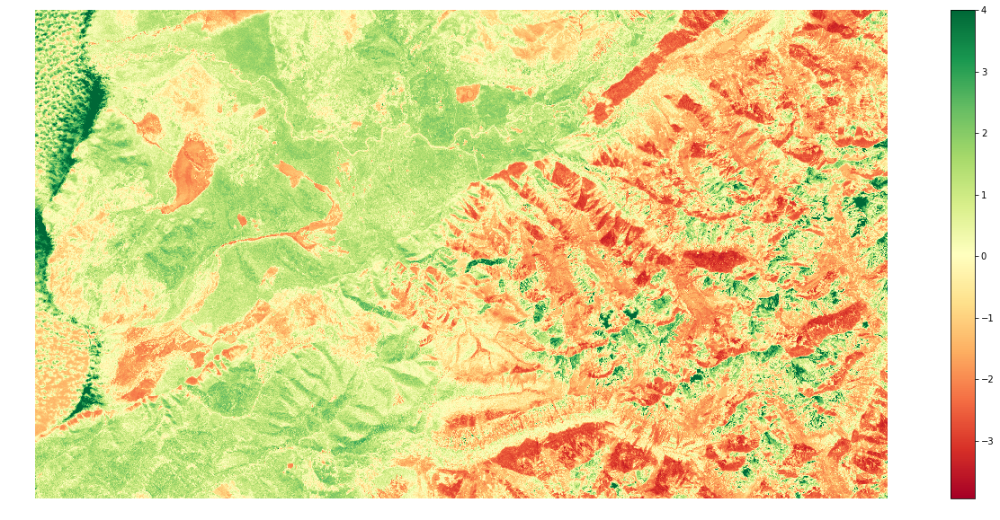

In [74]:
mpl.rcParams['figure.figsize'] = (25,10)

plt.imshow(component1, vmax=4, cmap='RdYlGn')
plt.colorbar()
plt.axis('off')

Откроем еще синтезированный снимок. Для этого соберем вместе три снимка.

In [20]:
B2_b = gdal.Open('Task 1/Ready data/B2.asc').ReadAsArray()
B3_g = gdal.Open('Task 1/Ready data/B3.asc').ReadAsArray()
B4_r = gdal.Open('Task 1/Ready data/B4.asc').ReadAsArray()
B8_nir = gdal.Open('Task 1/Ready data/B8.asc').ReadAsArray()

In [21]:
# вызываем эту normalize для всех наших трёх каналов
B2_n = normalize(B2_b)
B3_n = normalize(B3_g)
B4_n = normalize(B4_r)
B8_n = normalize(B8_nir)

In [22]:
# дополнительно нормализуем "темные снимки" (но снижается контрастность)
B2_m=(B2_n)**(1/1.9)
B3_m=(B3_n)**(1/2.3)
B4_m=(B4_n)**(1/1.9)
B8_m=(B8_n)**(1/1.7)

Text(0.5,1,'RGB composite image')

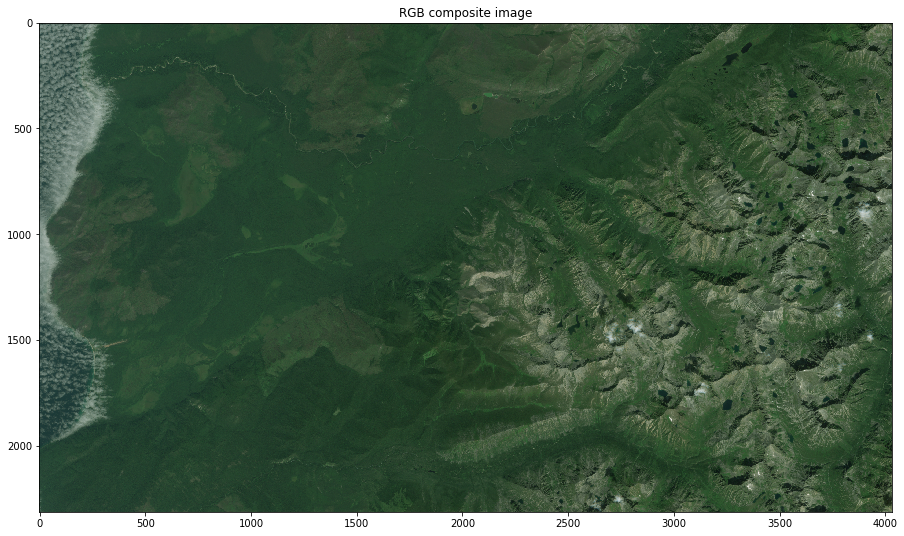

In [23]:
Composite = np.dstack([B4_m,B3_m,B2_m])

mpl.rcParams['figure.figsize'] = (17,9)
plt.imshow(Composite)
plt.title('RGB composite image')